<a href="https://colab.research.google.com/github/aliai22/BOVW-classification/blob/main/BOVW_flowers_dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## mounting google drive

In [1]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


## unzipping folder

In [2]:
!unzip -q '/content/drive/MyDrive/flower_photos.zip'

## importing libraries

In [3]:
import os
import numpy as np
import shutil
import cv2
import joblib
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier

## splitting the data into train and test folders

In [6]:
source_dir = '/content/flower_photos'


labels = []
images = []
total_images = 0
copied_images = 0


for subfolder in os.listdir(source_dir):
    for image in os.listdir(os.path.join(source_dir, subfolder)):
      total_images += 1
      images.append(image)
      labels.append(subfolder)
      copied_images +=1
  else:
    continue



# shuffling the images to remove any patterns
combined = list(zip(images, labels))
np.random.seed(7)
np.random.shuffle(combined)


train_proportion = 0.8
split_index = int(len(combined)*train_proportion)
train_part = combined[:split_index]
test_part = combined[split_index:]

train_dir = os.path.join(source_dir, 'train')
test_dir = os.path.join(source_dir, 'test')
os.makedirs(train_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

train_data = 0
test_data = 0
folder_paths = [os.path.join(source_dir, 'daisy'),
                os.path.join(source_dir, 'dandelion'),
                os.path.join(source_dir, 'roses'),
                os.path.join(source_dir, 'sunflowers'),
                os.path.join(source_dir, 'tulips')]

for image, label in train_part:
  target = os.path.join(source_dir, 'train', label)
  image_path = os.path.join(source_dir,label,image)
  if os.path.exists(target):
    shutil.copy(image_path, target)
  else:
    os.makedirs(target, exist_ok=True)
    shutil.copy(image_path, target)
  train_data += 1

for image, label in test_part:
  target = os.path.join(source_dir, 'test', label)
  image_path = os.path.join(source_dir,label,image)
  if os.path.exists(target):
    shutil.copy(image_path, target)
  else:
    os.makedirs(target, exist_ok=True)
    shutil.copy(image_path, target)
  test_data += 1

print('Total Images Found: {}'.format(total_images))
print('Copied Images: {}'.format(copied_images))
print()
print('Training Samples after 80-20 split: {}'.format(train_data)) 
print('Testing Samples after 80-20 split: {}'.format(test_data)) 

Total Images Found: 3670
Copied Images: 3670

Training Samples after 80-20 split: 2936
Testing Samples after 80-20 split: 734


## defining functions

In [7]:
def read_images(path,target='train'):
  images = []
  category = []
  for folder in os.listdir(os.path.join(path, target)):
    for image in os.listdir(os.path.join(os.path.join(path, target), folder)):
      img = cv2.imread(os.path.join(path, target, folder, image), cv2.COLOR_BGR2RGB)
      img = cv2.resize(img, (250,250)) # resizing
      images.append(img)
      category.append(folder)
  return images, np.array(category)

def get_descriptors(images):
  all_descs = []
  sift = cv2.xfeatures2d.SIFT_create()
  for image in images:
    keys, desc = sift.detectAndCompute(image,None)
    all_descs.append(desc)  
  return np.concatenate(all_descs), all_descs

def generate_codebook(descriptors, no_of_clusters):
  k_means = KMeans(n_clusters=no_of_clusters,
                   init='random',
                   n_init='auto',
                   random_state=42,
                   verbose=0
                   )
  k_means.fit(descriptors)
  joblib.dump(k_means, 'KMeans-model.joblib')
  return k_means.cluster_centers_

def frequency_vector(descriptors):
  kmeans = joblib.load('KMeans-model.joblib')
  freq_vec = []
  indices= []
  for i in range(0,len(descriptors)):
    for im in descriptors[i]:
      indice = kmeans.predict(im.reshape(1,-1))
      indices.append(indice)
    hist = np.histogram(indices, bins=np.arange(0,101))[0]
    #hist = hist / len(indices) # normalizing histogram
    freq_vec.append(hist)  
  return np.asarray(freq_vec)

def scale(features):
  scaler = StandardScaler()
  return scaler.fit_transform(features)

def shuffle(data,labels):
  np.random.seed(7)
  indices = np.random.permutation(data.shape[0])
  return data[indices],(labels)[indices]

def conf_matrix(true_label, preds, model):
  cm = confusion_matrix(true_label, preds)
  fig = plt.figure(figsize=(7,5))
  sns.heatmap(cm, annot=True, cmap='Blues', xticklabels=model.classes_, yticklabels=model.classes_)
  plt.show()

def perf_measures_from_conf_matrix(labels, preds, model): 
  cm = confusion_matrix(labels, preds)
  FPRs = dict()
  TPRs = dict()
  i = 0
  for each in model.classes_:
    TP = cm[i,i]
    FP = cm[i,:].sum() - TP
    FN = cm[:,1].sum() - TP
    TN = cm.sum().sum() - (TP+FP+FN)
    FPR = FP/(FP+TN)
    FPRs[each] = FPR
    TPR = TP/(TP+FN)
    TPRs[each] = TPR
    i+=1
  return FPRs, TPRs 

def quantitative_perf(test_data, labels, preds, model):
  print('Accuracy of the model: ', accuracy_score(model.predict(test_data), labels))
  print('F1 Score of the model: ', f1_score(labels, model.predict(test_data), average='weighted'))
  print()
  FPRs, TPRs = perf_measures_from_conf_matrix(labels,preds,model)
  for i in model.classes_:
    print('False Positive Rate of ','"',i,'"', 'is: ' , FPRs[i])
    print('True Positive Rate of ' ,'"', i,'"' , 'is: ' , TPRs[i])
    print()

def qualitative_perf(features,labels, images, model):
  model = joblib.load(model)
  fig = plt.figure(figsize=(15,20))
  i= 0
  label_idx = 600
  for image in features[600:]:
    resized = image.reshape(1,-1)
    predicted_label = model.predict(resized)
    true_label = labels[label_idx]
    if true_label == predicted_label:
      border_color = 'green'
    else:
      border_color = 'red'
    fig.add_subplot(4,4,i+1)
    plt.imshow(images[label_idx])
    plt.title('Actual: {}\nPrediction: {}'.format(true_label, predicted_label))
    plt.gca().spines['top'].set_color(border_color)
    plt.gca().spines['bottom'].set_color(border_color)
    plt.gca().spines['left'].set_color(border_color)
    plt.gca().spines['right'].set_color(border_color)
    plt.gca().title.set_color(border_color)
    i+=1
    label_idx += 1
    if i == 16:
      break
  plt.show()

def svm_clf(training_data, training_labels):
  # hyper parameter selection using gridsearchCV
  kernels = ['rbf', 'sigmoid']
  params_grid = {'C':np.logspace(-2, 1, 5),'gamma':np.logspace(-4, 0, 5), 'kernel':kernels}
  grid_search = GridSearchCV(SVC(random_state=42), param_grid=params_grid, cv=StratifiedKFold(shuffle=True, random_state=7))
  grid_search.fit(training_data, training_labels)
  searched_params = grid_search.best_params_
  C, gamma, kernel = searched_params.get('C'), searched_params.get('gamma'), searched_params.get('kernel')
  print(C)
  print(gamma)
  print(kernel)
  # fitting model
  svm = SVC(C=C,gamma=gamma, kernel=kernel, decision_function_shape='ovr', random_state=42)
  svm.fit(training_data, training_labels)
  # saving trained model
  joblib.dump(svm, 'svm-model.joblib')
  return svm

def RF_clf(training_data, training_labels):
  # applyting GridSearchCV
  rf_clf = RandomForestClassifier(random_state=7)
  para_grid = {'n_estimators':np.arange(50, 201, 50),
              'criterion':['gini', 'entropy'],
              'max_features': ['sqrt', 'log2'],
                'max_depth' : np.arange(4,11,1)
              }
  grid_search = GridSearchCV(estimator=rf_clf, param_grid=para_grid, cv=StratifiedKFold(shuffle=True, random_state=7))
  grid_search.fit(training_data, training_labels)
  params = grid_search.best_params_
  # creating random forest model
  n_estimators, max_features, max_depth, criterion = params.get('n_estimators'), params.get('max_features'), params.get('max_depth'), params.get('criterion')
  print(n_estimators)
  print(max_features)
  print(max_depth)
  print(criterion)
  RF = RandomForestClassifier(n_estimators=n_estimators, max_features=max_features, max_depth=max_depth, criterion=criterion, random_state=7)
  # training model
  RF.fit(training_data,training_labels)
  joblib.dump(RF, 'rf-model.joblib')
  return RF

## reading images

In [8]:
images_train, train_labels = read_images(path='/content/flower_photos')
len(images_train)

2936

In [9]:
images_test, test_labels = read_images(path='/content/flower_photos', target='test')
len(images_test)

734

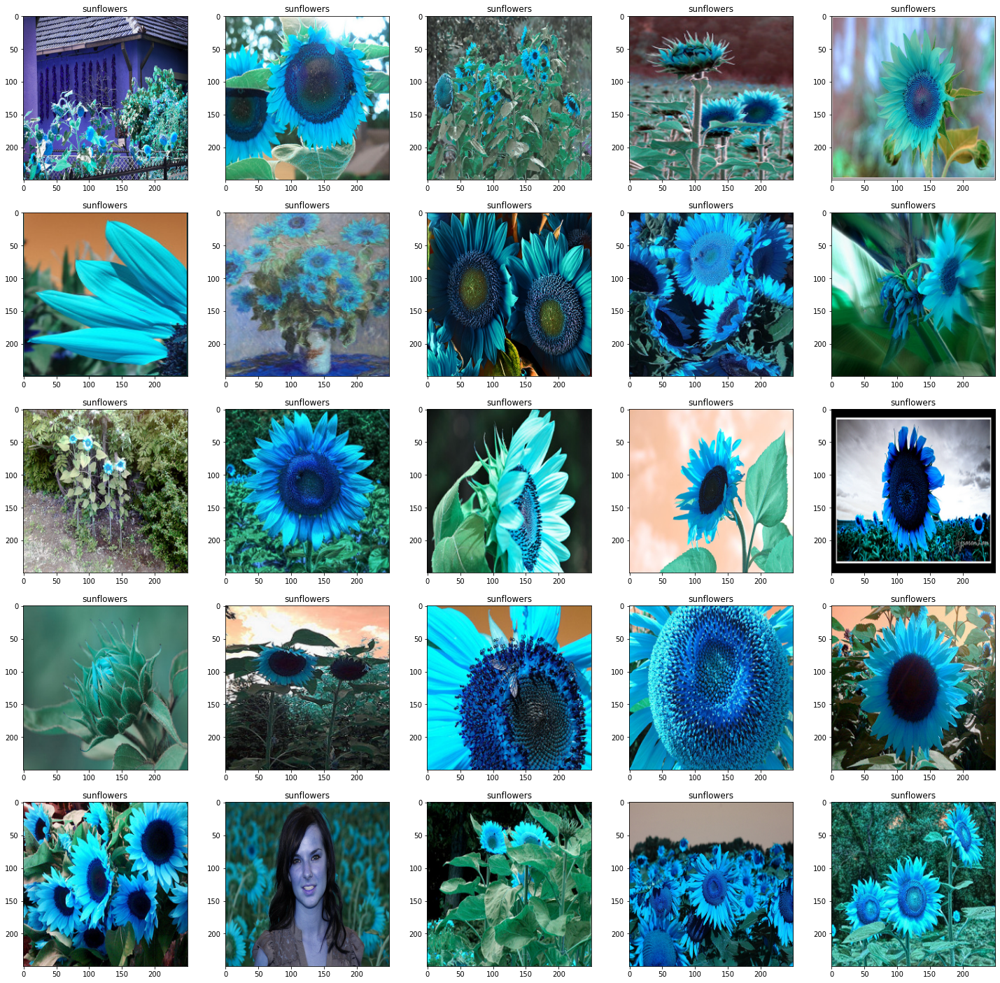

In [ ]:
# plotting training data (some samples)
i = 0
label_idx = 999
fig = plt.figure(figsize=(25,25))
for image in images_train[1000:]:
  fig.add_subplot(5,5,i+1)
  plt.imshow(image)
  plt.title(train_labels[label_idx])
  label_idx += 1
  i+=1
  if i == 25:
    break

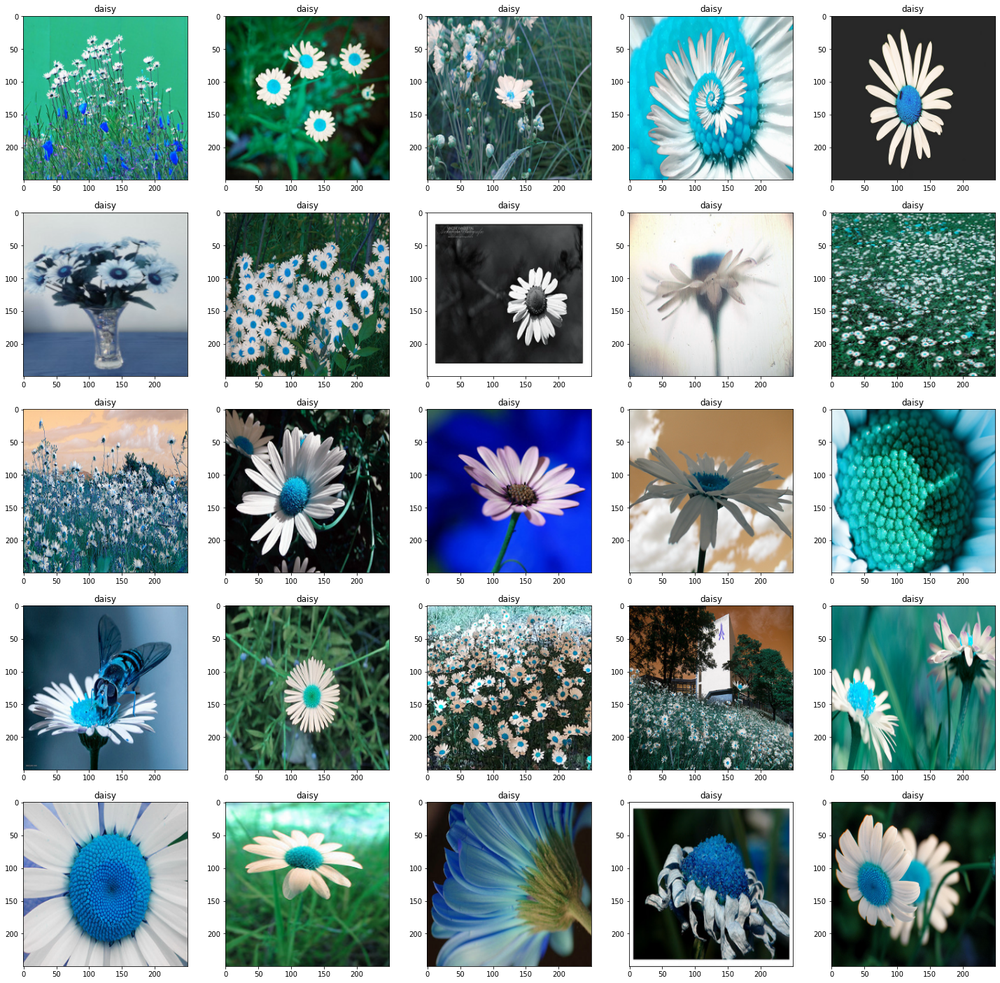

In [ ]:
# plotting testing data
i = 0
fig = plt.figure(figsize=(25,25))
for image in images_test:
  fig.add_subplot(5,5,i+1)
  plt.imshow(image)
  plt.title(test_labels[i])
  i+=1
  if i == 25:
    break

## getting descriptors

In [10]:
# descriptors for training data
descriptors_train, descriptors_per_train_image = get_descriptors(images_train)
print(descriptors_train.shape)
print(len(descriptors_per_train_image))

(1459362, 128)
2936


In [11]:
# descriptors for testing data
descriptors_test, descriptors_per_test_image = get_descriptors(images_test)
print(descriptors_test.shape)
print(len(descriptors_per_test_image))

(369567, 128)
734


## generating vocabulary

In [13]:
vocab= generate_codebook(descriptors=descriptors_train, no_of_clusters=100)
vocab.shape

(100, 128)

In [15]:
kmeans = joblib.load('KMeans-model.joblib')
vocab = kmeans.cluster_centers_

In [16]:
vocab.shape

(100, 128)

## getting frequency vectors/histograms

In [17]:
freq_vec_train_images = frequency_vector(descriptors_per_train_image)
freq_vec_train_images.shape

(2936, 100)

In [18]:
freq_vec_test_images = frequency_vector(descriptors_per_test_image)
freq_vec_test_images.shape

(734, 100)

## scaling frequency vectors

In [19]:
scaled_train = scale(freq_vec_train_images)
scaled_test = scale(freq_vec_test_images)

scaled_train.shape, scaled_test.shape

((2936, 100), (734, 100))

## shuffling data randomly

In [20]:
X_train, y_train = shuffle(scaled_train, train_labels)
X_test, y_test = shuffle(scaled_test, test_labels)

## classification using SVM

In [17]:
svm = svm_clf(training_data = X_train, training_labels = y_train)

35.93813663804626
1.0
rbf


In [18]:
predictions_svm = svm.predict(X_test)

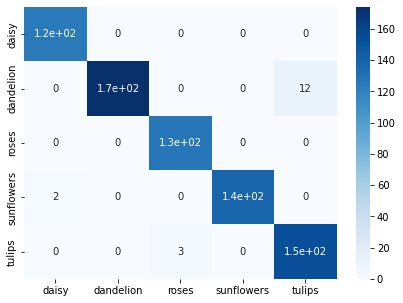

In [19]:
conf_matrix(true_label=y_test, preds=predictions_svm, model=svm)

In [20]:
FPRs, TPRs = perf_measures_from_conf_matrix(labels=y_test, preds=predictions_svm, model=svm)

In [21]:
quantitative_perf(test_data=X_test, labels=y_test, preds=predictions_svm, model=svm)

Accuracy of the model:  0.9768392370572208
F1 Score of the model:  0.9768765226843721

False Positive Rate of  " daisy " is:  0.0
True Positive Rate of  " daisy " is:  0.7183908045977011

False Positive Rate of  " dandelion " is:  0.02142857142857143
True Positive Rate of  " dandelion " is:  1.0

False Positive Rate of  " roses " is:  0.0
True Positive Rate of  " roses " is:  0.7241379310344828

False Positive Rate of  " sunflowers " is:  0.0035714285714285713
True Positive Rate of  " sunflowers " is:  0.7931034482758621

False Positive Rate of  " tulips " is:  0.005357142857142857
True Positive Rate of  " tulips " is:  0.8850574712643678



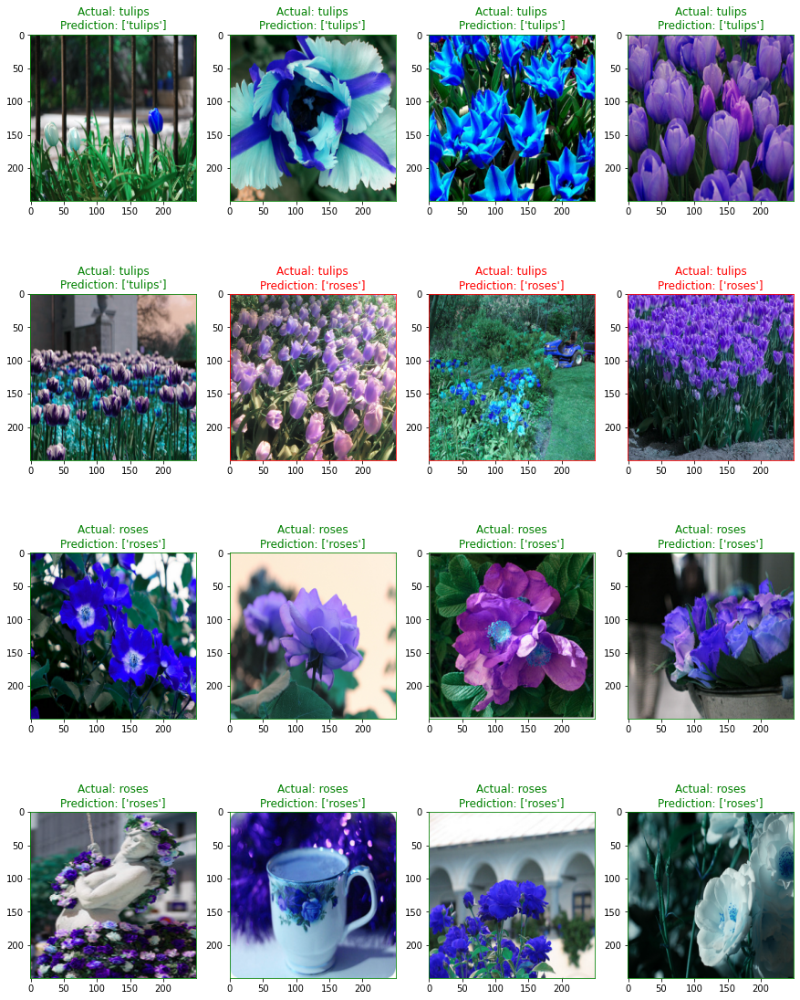

In [57]:
qualitative_perf(features=scaled_test, labels=test_labels, images=images_test, model='svm-model.joblib')

## classification using Random Forest

In [21]:
rf_clf = RF_clf(training_data = X_train, training_labels=y_train)

50
sqrt
4
gini


In [22]:
predictions_rf = rf_clf.predict(X_test)

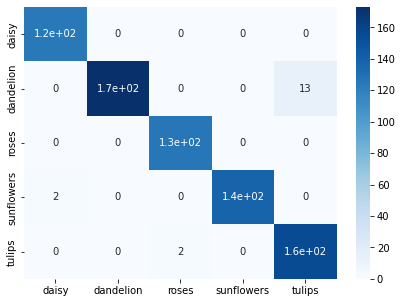

In [24]:
conf_matrix(true_label=y_test, preds=predictions_rf, model=rf_clf)

In [25]:
FPRs, TPRs = perf_measures_from_conf_matrix(labels=y_test, preds=predictions_rf, model=rf_clf)

In [26]:
quantitative_perf(test_data=X_test, labels=y_test, preds=predictions_rf, model=rf_clf)

Accuracy of the model:  0.9768392370572208
F1 Score of the model:  0.9768761394936759

False Positive Rate of  " daisy " is:  0.0
True Positive Rate of  " daisy " is:  0.7225433526011561

False Positive Rate of  " dandelion " is:  0.023172905525846704
True Positive Rate of  " dandelion " is:  1.0

False Positive Rate of  " roses " is:  0.0
True Positive Rate of  " roses " is:  0.7283236994219653

False Positive Rate of  " sunflowers " is:  0.0035650623885918
True Positive Rate of  " sunflowers " is:  0.7976878612716763

False Positive Rate of  " tulips " is:  0.0035650623885918
True Positive Rate of  " tulips " is:  0.8959537572254336



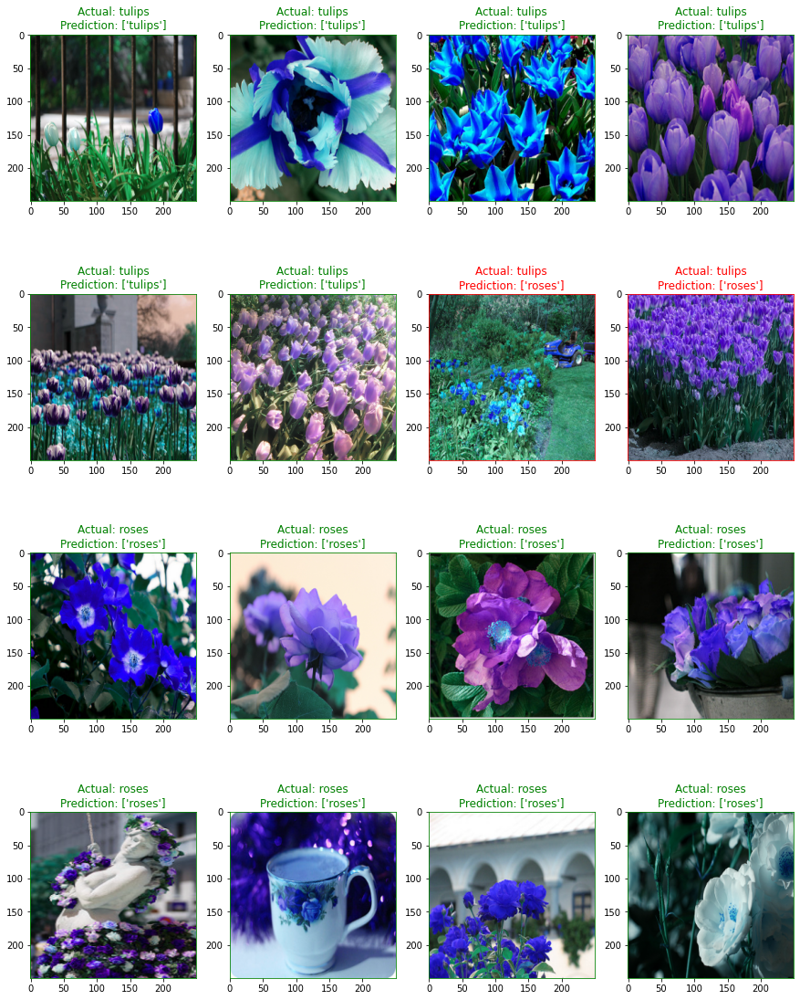

In [27]:
qualitative_perf(features=scaled_test, labels=test_labels, images=images_test, model='rf-model.joblib')